## Explore and Clean dataset

###### Load the dataset and understand its structure.
###### Check for missing values and handle them appropriately.
###### Explore the distribution of numerical variables.
###### Check for outliers and decide whether to remove or transform them.

In [ ]:
import pandas as pd 
import numpy as np
import torch
from torch import nn
from torch import optim
from torch.utils.data import DataLoader, TensorDataset
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

In [2]:
data = pd.read_csv('Life Expectancy Data.csv')

In [3]:
def standard_scaling(X, num_features):
    for feature in num_features:
        X[feature] = (X[feature] - X[feature].mean()) / X[feature].std()
    return X    

In [4]:
num_features = data.select_dtypes(include=['int64', 'float64']).columns
cat_features = data.select_dtypes(include=['object']).columns

data[num_features] = data[num_features].fillna(data[num_features].mean())
data[cat_features] = data[cat_features].fillna(data[cat_features].mode().iloc[0])
print(num_features)
# another technique for impute missed value :
# data.fillna(data.mean(), inplace=True)
# data['cat_features'].fillna(data['cat_features'].mode()[0], inplace=True)

Index(['Year', 'Life expectancy ', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')


In [5]:
data.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000,2938.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.938190,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.507640,124.080302,117.926501,3.916288,1987.914858,22.586855,11467.272489,19.927677,160.445548,23.352143,2.400274,23.640073,5.077785,13136.800417,5.381546e+07,4.394535,4.482708,0.204820,3.264381
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.370000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.200000,74.000000,0.000000,1.092500,4.685343,80.940461,0.000000,19.400000,0.000000,78.000000,4.370000,78.000000,0.100000,580.486996,4.189172e+05,1.600000,1.600000,0.504250,10.300000
50%,2008.000000,72.000000,144.000000,3.000000,4.160000,64.912906,87.000000,17.000000,43.000000,4.000000,93.000000,5.938190,93.000000,0.100000,3116.561755,3.675929e+06,3.400000,3.400000,0.662000,12.100000
75%,2012.000000,75.600000,227.000000,22.000000,7.390000,441.534144,96.000000,360.250000,56.100000,28.000000,97.000000,7.330000,97.000000,0.800000,7483.158469,1.275338e+07,7.100000,7.200000,0.772000,14.100000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.600000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


<Axes: >

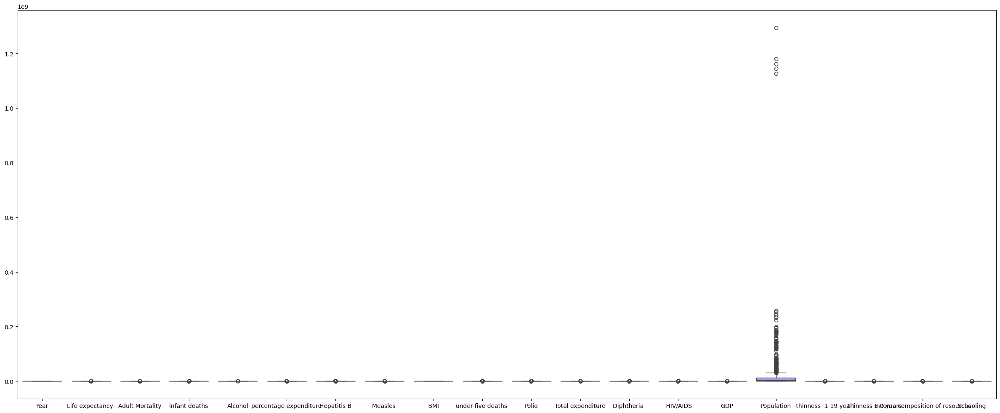

In [6]:
plt.figure(figsize=(30, 12))
sns.boxplot(data)

In [7]:
for feature in num_features:
    q1 = data[feature].quantile(0.25)
    q3 = data[feature].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    data[feature] = data[feature].apply(lambda x:upper_bound if x>upper_bound else( lower_bound if x<lower_bound else x))

print(num_features)
X = data.drop('Life expectancy ', axis=1)
y = data['Life expectancy ']
num_features = X.select_dtypes(include=['int64', 'float64']).columns
# num_features = num_features.delete(num_features.get_loc('Y house price of unit area'))
X = standard_scaling(X, num_features)
X

Index(['Year', 'Life expectancy ', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')


,Country,Year,Status,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,1.621486,Developing,0.874372,2.164688,-1.173161,-0.546317,-1.533803,1.885904,-0.964550,...,-2.265245,0.985156,-1.282163,-0.629102,-0.814658,2.649594,2.708423,2.737192,-0.799184,-0.626875
1,Afghanistan,1.404747,Developing,0.943646,2.164688,-1.173161,-0.540555,-1.768113,0.730331,-0.989641,...,-1.727241,0.993892,-1.472274,-0.629102,-0.809577,-0.826577,2.708423,2.737192,-0.814845,-0.659125
2,Afghanistan,1.188008,Developing,0.917668,2.164688,-1.173161,-0.541337,-1.611906,0.554998,-1.014732,...,-1.474063,0.972053,-1.345534,-0.629102,-0.806173,2.649594,2.708423,2.737192,-0.846166,-0.691375
3,Afghanistan,0.971269,Developing,0.952305,2.164688,-1.173161,-0.528588,-1.377597,1.885904,-1.039823,...,-1.157591,1.142400,-1.155423,-0.629102,-0.799346,-0.447868,2.708423,2.737192,-0.882708,-0.723626
4,Afghanistan,0.754530,Developing,0.978283,2.164688,-1.173161,-0.711118,-1.299494,1.885904,-1.059895,...,-1.094296,0.858488,-1.092052,-0.629102,-0.907695,-0.528609,2.708423,2.737192,-0.929691,-0.820377
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,-0.762644,Developing,2.549931,0.699405,-0.061897,-0.729341,-1.299494,-0.573355,-0.563099,...,-1.157591,0.535264,-1.282163,1.894719,-0.837865,0.572764,1.194514,1.176803,-1.175044,-0.917128
2934,Zimbabwe,-0.979384,Developing,2.549931,0.647073,-0.138536,-0.729341,-2.053099,1.885904,-0.583171,...,-2.265245,0.268823,-1.092052,1.894719,-0.838047,0.556622,1.296289,1.302641,-1.117621,-0.820377
2935,Zimbabwe,-1.196123,Developing,-0.770880,0.594742,-0.044015,-0.729341,-0.908979,0.198676,-0.603244,...,-0.777824,0.273191,-0.901941,1.894719,-0.908801,-0.849288,-0.891881,-0.861770,-1.070639,-0.659125
2936,Zimbabwe,-1.412862,Developing,2.549931,0.594742,-0.736319,-0.729341,-0.674670,0.834966,-0.623316,...,-0.587940,0.111579,-0.648460,1.894719,-0.821031,0.526530,-0.790106,-0.761100,-1.070639,-0.723626


#### Report a:
I first downloaded the data from the Kegel site and loaded it into the code. Then I separated the numerical data, which actually we did not have non-numerical data from the beginning. In the next step, I implemented a replacement for the missing data, which used the replacement method with the mean. Then, by checking the box diagram and the shape of the quartiles, the upper limit and the lower limit, outliers were identified and they were rounded to the nearest number in I converted the desired range.

## Visualize Data

<Axes: >

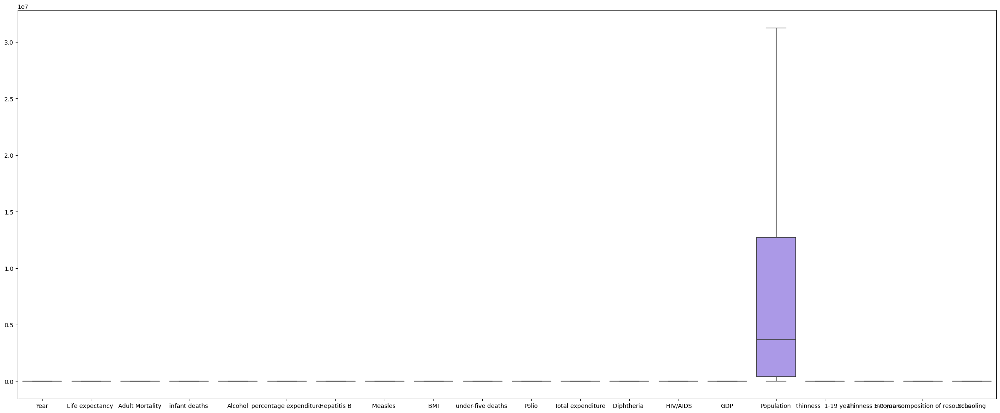

In [8]:
plt.figure(figsize=(30, 12))
sns.boxplot(data)

As you can see, compared to the previous box diagram, we don't have any more data scatter(Outlier).

<Axes: >

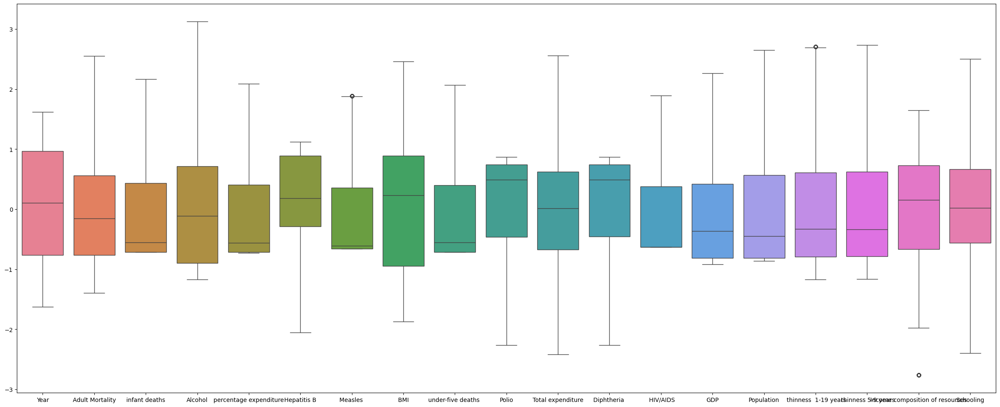

In [9]:
plt.figure(figsize=(30, 12))
sns.boxplot(X)

This is also the effect of the Standard_scaling function on data

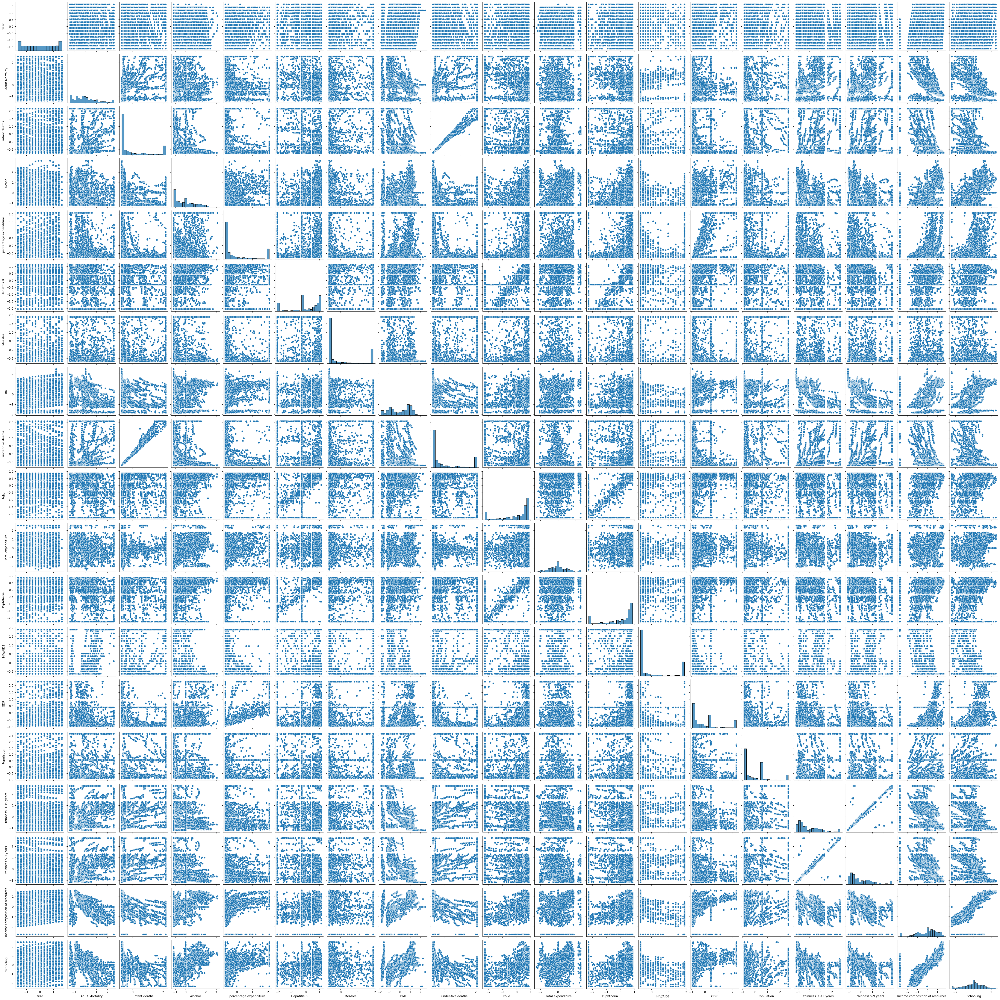

In [10]:
sns.pairplot(X)
plt.show()

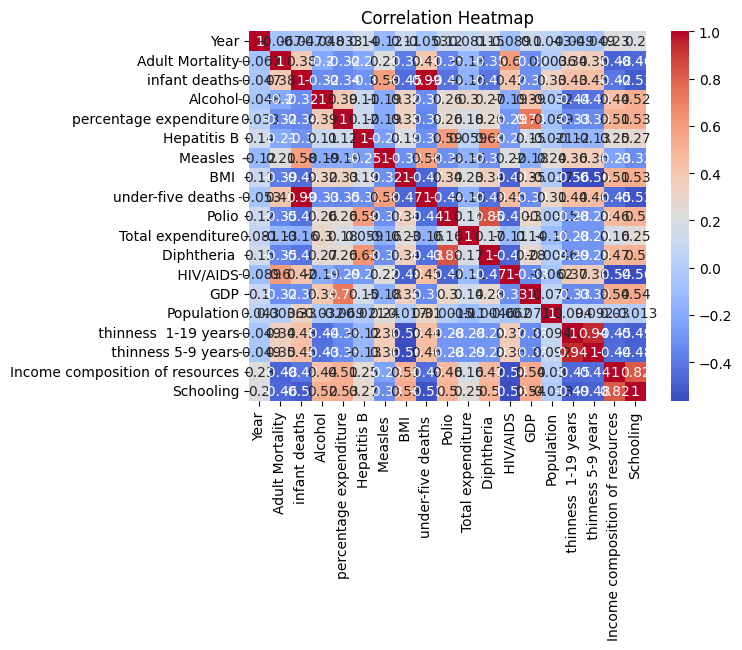

In [11]:
correlation_matrix = data[num_features].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

Variables that have a higher correlation with the target variable play a greater role in determining the weights.

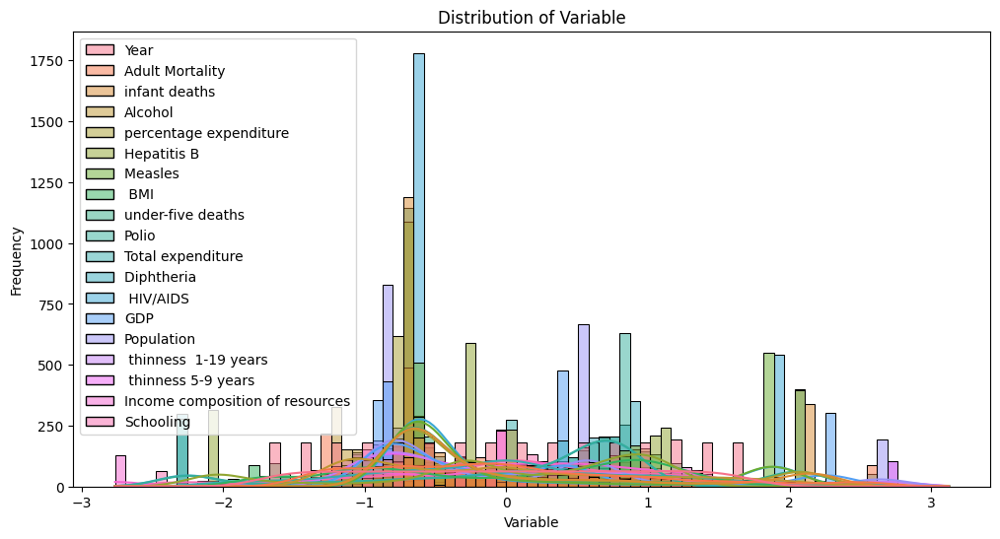

In [12]:
plt.figure(figsize=(12, 6))
sns.histplot(X, kde=True)
plt.title('Distribution of Variable')
plt.xlabel('Variable')
plt.ylabel('Frequency')
plt.show()


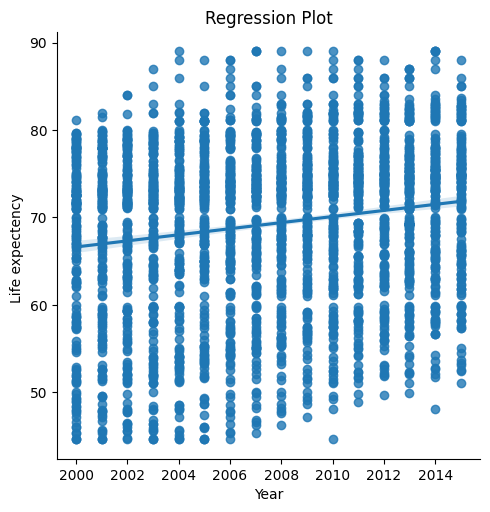

In [13]:
sns.lmplot(x="Year", y="Life expectancy ", data=data)
plt.title('Regression Plot')
plt.xlabel('Year')
plt.ylabel('Life expectency ')
plt.show()

From this graph, we can roughly conclude that with the passage of time, the average life expectancy in the countries has increased. That is, from 2000 to 2015, there are fewer countries in which life expectancy is around 50 or less, and there are also more countries in which life expectancy is above 80.


# Part B

In [14]:
df = data[['Country', 'Status', 'Hepatitis B']]
group = df.groupby('Status')
group['Hepatitis B'].describe()


,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
Developed,512.0,87.48853,9.789384,58.351153,80.940461,89.0,96.0,99.0
Developing,2426.0,84.03665,13.276767,58.351153,78.000000,86.5,96.0,99.0


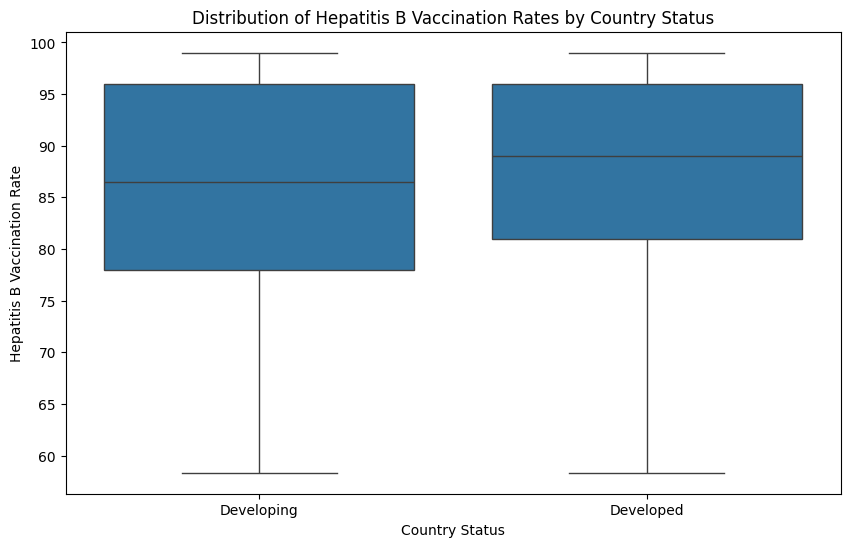

In [15]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Status', y='Hepatitis B', data=df)
plt.title('Distribution of Hepatitis B Vaccination Rates by Country Status')
plt.xlabel('Country Status')
plt.ylabel('Hepatitis B Vaccination Rate')
plt.show()

In [16]:
df = data[['Status', 'Life expectancy ']]
group = df.groupby('Status')
group['Life expectancy '].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
Developed,512.0,79.197852,3.930942,69.9,76.8,79.25,81.7,89.0
Developing,2426.0,67.132131,8.955409,44.6,61.1,69.05,74.0,89.0


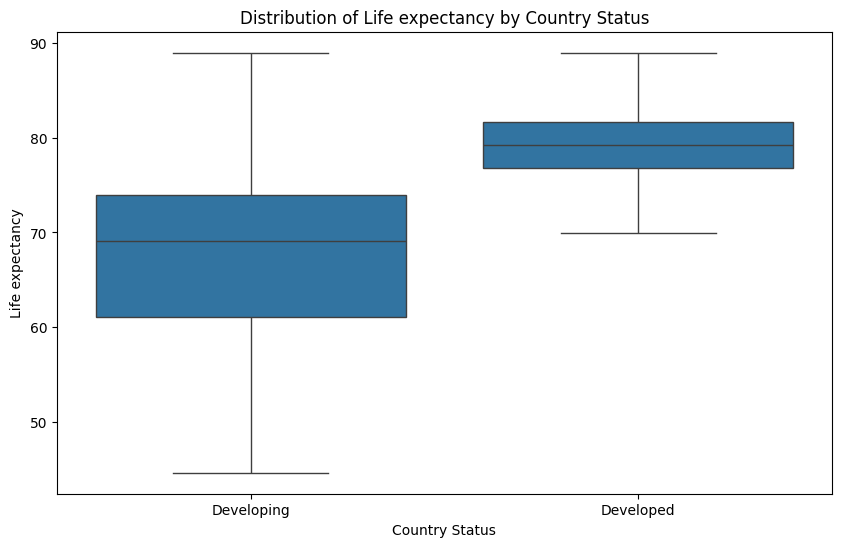

In [17]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Status', y='Life expectancy ', data=df)
plt.title('Distribution of Life expectancy by Country Status')
plt.xlabel('Country Status')
plt.ylabel('Life expectancy')
plt.show()

It can be concluded from this graph that there is a significant difference between life expectancy in developed and developing countries. The more developed a country is, the higher its life expectancy is, and this difference is on average

In [18]:
mean_developed = df[df['Status'] == 'Developed']['Life expectancy '].mean()
std_dev_developed = df[df['Status'] == 'Developed']['Life expectancy '].std()

mean_developing = df[df['Status'] == 'Developing']['Life expectancy '].mean()
std_dev_developing = df[df['Status'] == 'Developing']['Life expectancy '].std()

n_developed = df[df['Status'] == 'Developed']['Life expectancy '].count()
n_developing = df[df['Status'] == 'Developing']['Life expectancy '].count()

pooled_std_dev = np.sqrt(((n_developed - 1) * std_dev_developed ** 2 + (n_developing - 1) * std_dev_developing ** 2)
                         / (n_developed + n_developing - 2))
t = (mean_developed - mean_developing) / (pooled_std_dev * np.sqrt(1 / n_developed + 1 / n_developing))
alpha = 0.05
free_deg = n_developed + n_developing - 2
critical_val = abs(t)
if critical_val > 2.064: 
    print("Rejected null hypothesis.")
else:
    print("Failed to reject null hypothesis")


Rejected null hypothesis.


In [19]:
df = data[['Year', 'Life expectancy ']]
group = df.groupby('Year')
group['Life expectancy '].describe()

,count,mean,std,min,25%,50%,75%,max
Year,,,,,,,,
2000,183.0,66.793443,10.192394,44.6,58.65,71.0,74.45,81.1
2001,183.0,67.154645,10.128497,44.6,59.00,71.2,74.90,82.0
2002,183.0,67.354645,10.054913,44.6,59.35,71.4,74.80,84.0
2003,183.0,67.450820,10.085328,44.6,59.75,71.1,74.70,87.0
2004,183.0,67.660656,10.092369,44.6,60.70,71.2,74.30,89.0
2005,183.0,68.216940,9.780486,44.6,63.50,71.6,74.95,88.0
2006,183.0,68.669399,9.811103,44.6,62.25,72.1,75.00,88.0
2007,183.0,69.036066,9.618584,45.3,62.05,72.4,75.15,89.0
2008,183.0,69.427869,9.202612,46.2,62.70,72.4,75.35,89.0


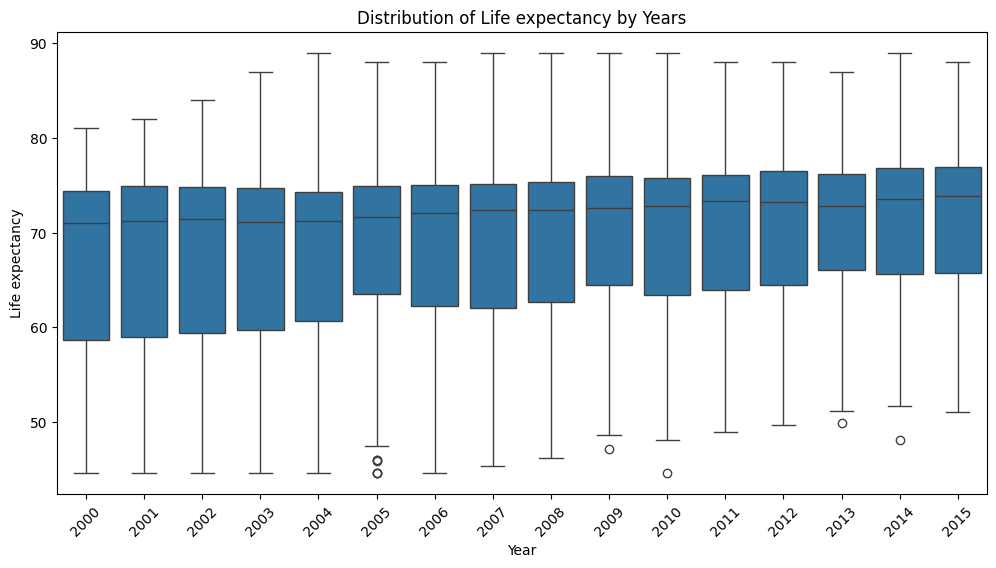

In [20]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year', y='Life expectancy ', data=df)
plt.title('Distribution of Life expectancy by Years')
plt.xlabel('Year')
plt.ylabel('Life expectancy')
plt.xticks(rotation=45)
plt.show()

From this graph, it can be concluded that life expectancy has increased over time and in different years.

In [21]:
means = [group.get_group(year)['Life expectancy '].mean() for year in df['Year'].unique()]
means

[71.61693989071038,
 71.5366120218579,
 71.13186174580254,
 70.91693989071038,
 70.65409836065574,
 70.09398907103825,
 69.93825136612023,
 69.42786885245901,
 69.03606557377049,
 68.66939890710383,
 68.21693989071039,
 67.66065573770493,
 67.45081967213113,
 67.35464480874317,
 67.15464480874319,
 66.79344262295082]

In [22]:
total_mean =np.mean(means)
total_mean

69.22832332632578

In [23]:
from scipy.stats import pearsonr
bmi = data[' BMI ']
population = data['Population']
mean_bmi = np.mean(bmi)
mean_population = np.mean(population)
covar = np.sum((bmi - mean_bmi) * (population - mean_population))
std_dev_bmi = np.std(bmi)
std_dev_population = np.std(population)
corr_coefficient = covar/ (std_dev_bmi * std_dev_population)
n = len(bmi)
t = corr_coefficient * np.sqrt((n - 2) / (1 - corr_coefficient ** 2))
free_deg = n - 2
alpha = 0.05
if free_deg <= 30:
    t_critical = 2.045
else:
    t_critical = 1.96
p_value = None
if np.abs(t) > t_critical:
    p_value = 2 * (1 - alpha)
print("Correlation Coefficient:", corr_coefficient)
print("t statistic:", t)
print("p value:", p_value)
if p_value is not None and p_value < alpha:
    print("Rejected null hypothesis.")
else:
    print("Failed to reject null hypothesis.")


Correlation Coefficient: -49.965855757946166
t statistic: nan
p value: None
Failed to reject null hypothesis.


C:\Users\USER\AppData\Local\Temp\ipykernel_16120\1964343174.py:11: RuntimeWarning: invalid value encountered in sqrt
  t = corr_coefficient * np.sqrt((n - 2) / (1 - corr_coefficient ** 2))


## Part C

In [24]:
corr = data[num_features].corr()
corr

,Year,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Year,1.000000,-0.066535,-0.047331,-0.048212,0.032619,0.141336,-0.121195,0.108327,-0.052794,0.115490,0.080874,0.147625,-0.089499,0.104351,0.043251,-0.049048,-0.049470,0.229349,0.199153
Adult Mortality,-0.066535,1.000000,0.383597,-0.199175,-0.322282,-0.205293,0.210591,-0.393170,0.407770,-0.353826,-0.125546,-0.352568,0.602000,-0.318642,0.003645,0.343969,0.351491,-0.476508,-0.463999
infant deaths,-0.047331,0.383597,1.000000,-0.323964,-0.344931,-0.304186,0.581518,-0.448125,0.994243,-0.422295,-0.156067,-0.413555,0.415331,-0.317675,0.326736,0.429910,0.446088,-0.416039,-0.507119
Alcohol,-0.048212,-0.199175,-0.323964,1.000000,0.386407,0.105190,-0.194364,0.318080,-0.330473,0.260691,0.303826,0.266048,-0.190386,0.393074,-0.031599,-0.436139,-0.426472,0.438160,0.517812
percentage expenditure,0.032619,-0.322282,-0.344931,0.386407,1.000000,0.115279,-0.194216,0.328152,-0.353278,0.264616,0.182922,0.263284,-0.294376,0.728538,-0.069442,-0.331516,-0.333485,0.514928,0.529322
Hepatitis B,0.141336,-0.205293,-0.304186,0.105190,0.115279,1.000000,-0.252666,0.189328,-0.312458,0.592076,0.058810,0.627559,-0.266511,0.148223,-0.020915,-0.124914,-0.130809,0.252361,0.267687
Measles,-0.121195,0.210591,0.581518,-0.194364,-0.194216,-0.252666,1.000000,-0.316726,0.579652,-0.319003,-0.158407,-0.313516,0.224559,-0.176246,0.235509,0.358722,0.363431,-0.231723,-0.325452
BMI,0.108327,-0.393170,-0.448125,0.318080,0.328152,0.189328,-0.316726,1.000000,-0.469134,0.339597,0.226815,0.338477,-0.479726,0.345459,-0.017007,-0.555854,-0.564329,0.505954,0.532959
under-five deaths,-0.052794,0.407770,0.994243,-0.330473,-0.353278,-0.312458,0.579652,-0.469134,1.000000,-0.443199,-0.157315,-0.433826,0.454939,-0.330392,0.305226,0.441592,0.455788,-0.445969,-0.534202
Polio,0.115490,-0.353826,-0.422295,0.260691,0.264616,0.592076,-0.319003,0.339597,-0.443199,1.000000,0.162177,0.846472,-0.470808,0.299130,-0.001501,-0.284789,-0.283314,0.464057,0.499197


correlation coefficient ranges from -1 to 1, where:\
1 indicates a perfect positive linear relationship,\
-1 indicates a perfect negative linear relationship, and\
0 indicates no linear relationship.

# Part D

In [25]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

In [26]:
label_encoder = LabelEncoder()
data['Country_Encoded'] = label_encoder.fit_transform(data['Country'])
country = data['Country_Encoded'].unique()


data['Status_Encoded'] = label_encoder.fit_transform(data['Status'])

train_country, test_country =  train_test_split(country, test_size=0.2, random_state=42)
train_data = data[data['Country_Encoded'].isin(train_country)]
test_data = data[data['Country_Encoded'].isin(test_country)]

# data_encoded =pd.get_dummies(data, cat_features)
# train_data = train_data.drop(cat_features, axis=1, inplace=False)
# train_data = pd.concat([train_data, data_encoded], axis=1)

# data_encoded =pd.get_dummies(data, cat_features)
# test_data = test_data.drop(cat_features, axis=1, inplace=False)
# test_data = pd.concat([test_data, data_encoded], axis=1)


X_train1 = train_data.drop(['Life expectancy ','Country','Status'], axis=1)
y_train1 = train_data['Life expectancy ']
X_test1 = test_data.drop(['Life expectancy ','Country','Status'], axis=1)
y_test1 = test_data['Life expectancy ']



data2 = data.drop(['Country'], axis=1)
data_encoded =pd.get_dummies(data2, 'Status')


data2 = data2.drop('Status', axis=1, inplace=True)

data2 = pd.concat([data2, data_encoded], axis=1)
train_data, test_data = train_test_split(data2, test_size=0.2, random_state=42)

X_train2 = train_data.drop(['Life expectancy '], axis=1)
y_train2 = train_data['Life expectancy ']
X_test2 = test_data.drop(['Life expectancy '], axis=1)
y_test2 = test_data['Life expectancy ']



In [27]:
from sklearn.metrics import mean_squared_error, r2_score

model1 = LinearRegression()
model1.fit(X_train1, y_train1)
b = model1.intercept_
w = model1.coef_[0]
print("b:", b)
print("Weights:", w)

model2 = LinearRegression()
model2.fit(X_train2, y_train2)
b = model2.intercept_
w = model2.coef_[0]
print("\nb:", b)
print("Weights:", w)

y_pred1 = model1.predict(X_test1)
mse1 = mean_squared_error(y_test1, y_pred1)
r2_1 = r2_score(y_test1, y_pred1)


y_pred2 = model2.predict(X_test2)
mse2 = mean_squared_error(y_test2, y_pred2)
r2_2 = r2_score(y_test2, y_pred2)

print("\nWith 'Country':")
print("Mean Squared Error:", mse1)
print("R-squared:", r2_1)
print("\nWithout 'Country':")
print("Mean Squared Error:", mse2)
print("R-squared:", r2_2)

b: -107.19454123039382
Weights: 0.08706039514433105

b: -164.67490412615535
Weights: 0.11536017969644423

With 'Country':
Mean Squared Error: 16.234365084689895
R-squared: 0.8134330411382202

Without 'Country':
Mean Squared Error: 12.053290312444231
R-squared: 0.860670062360857


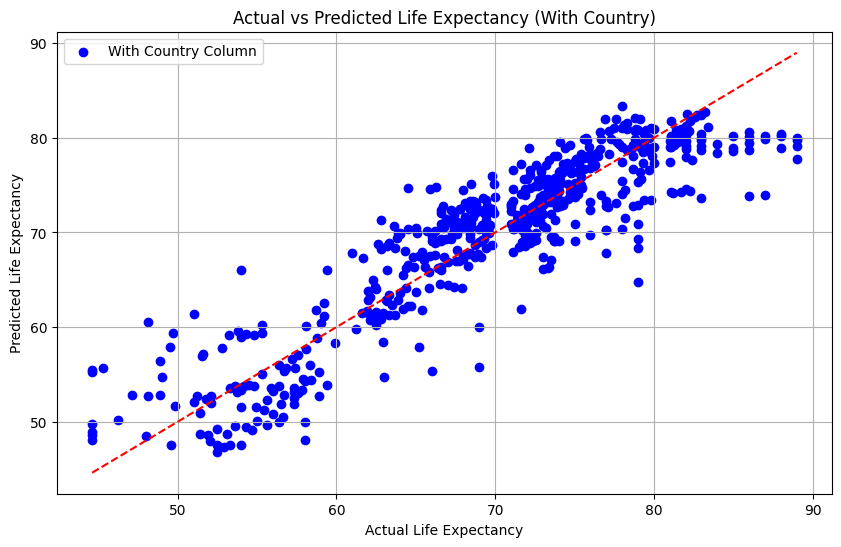

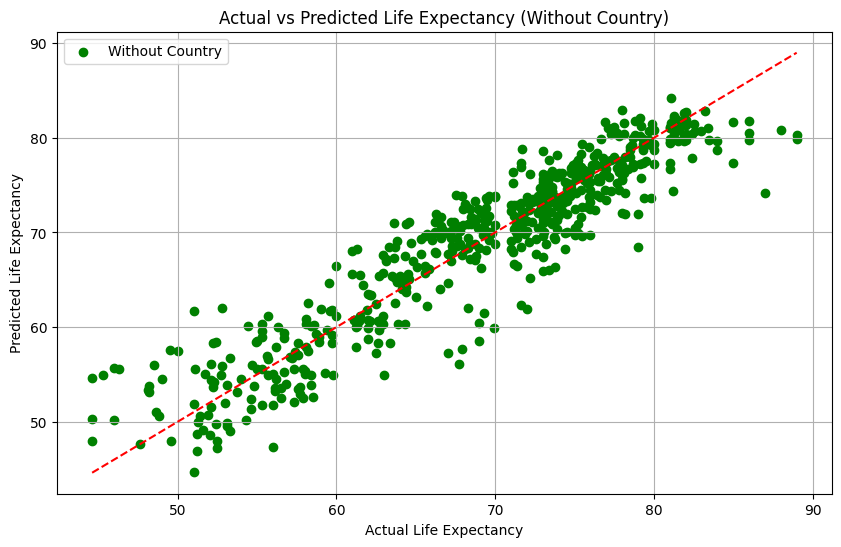

In [28]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test1, y_pred1, color='blue', label='With Country Column')
plt.plot([min(y_test1), max(y_test1)], [min(y_test1), max(y_test1)], color='red', linestyle='--')
plt.xlabel('Actual Life Expectancy')
plt.ylabel('Predicted Life Expectancy')
plt.title('Actual vs Predicted Life Expectancy (With Country)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(y_test2, y_pred2, color='green', label='Without Country')
plt.plot([min(y_test2), max(y_test2)], [min(y_test2), max(y_test2)], color='red', linestyle='--')
plt.xlabel('Actual Life Expectancy')
plt.ylabel('Predicted Life Expectancy')
plt.title('Actual vs Predicted Life Expectancy (Without Country)')
plt.legend()
plt.grid(True)
plt.show()


The model that includes the country column gives more accurate results and less error. So, for a more accurate forecast, it is better not to ignore the country pillar and its impact.

# Part E

In [29]:
data_encoded =pd.get_dummies(data, cat_features)
# encoder = OneHotEncoder(drop='first')
# encoder.fit(data[cat_features])

# data_encoded = pd.DataFrame(encoder.transform(data[cat_features]).toarray(), columns=encoder.get_feature_names_out(cat_features))
# data_encoded = pd.DataFrame(encoder.transform(data[cat_features]).toarray(), columns=encoder.get_feature_names_out(cat_features))

data1 = data.drop(cat_features, axis=1, inplace=False)

data1 = pd.concat([data1, data_encoded], axis=1)
# # X_test1 = pd.concat([X_test1, X_test_encoded], axis=1)

train_data, test_data = train_test_split(data1, test_size=0.2, random_state=42)

X_train1 = train_data.drop(['Life expectancy '], axis=1)
y_train = train_data['Life expectancy ']
X_test1 = test_data.drop(['Life expectancy '], axis=1)
y_test = test_data['Life expectancy ']



data2 = data.drop(['Country'], axis=1)
data_encoded =pd.get_dummies(data2, 'Status')
# encoder = OneHotEncoder(drop='first')
# encoder.fit(data2['Status'])
# data_encoded = pd.DataFrame(encoder.transform(data2['Status']).toarray(), columns=encoder.get_feature_names_out('Status'))
# data_encoded = pd.DataFrame(encoder.transform(data2['Status']).toarray(), columns=encoder.get_feature_names_out('Status'))

data2 = data2.drop('Status', axis=1, inplace=True)

data2 = pd.concat([data2, data_encoded], axis=1)
train_data, test_data = train_test_split(data2, test_size=0.2, random_state=42)

X_train2 = train_data.drop(['Life expectancy '], axis=1)
y_train = train_data['Life expectancy ']
X_test2 = test_data.drop(['Life expectancy '], axis=1)
y_test = test_data['Life expectancy ']



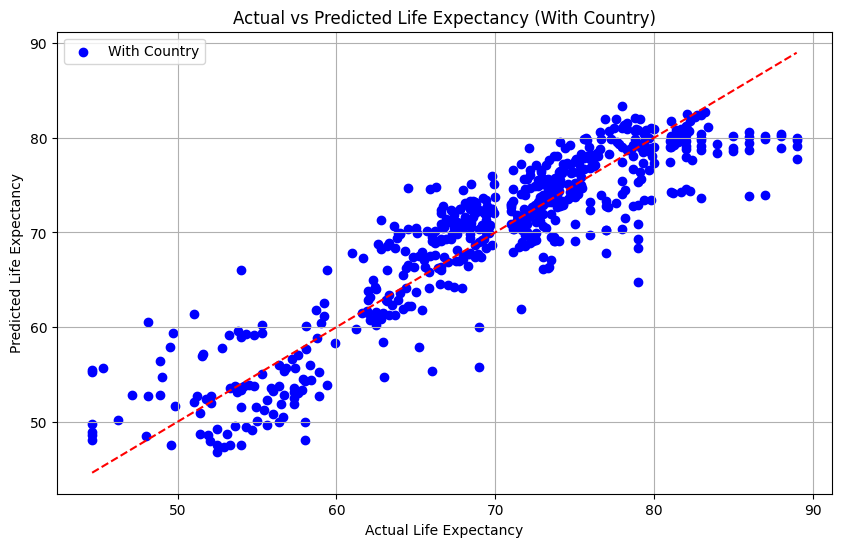

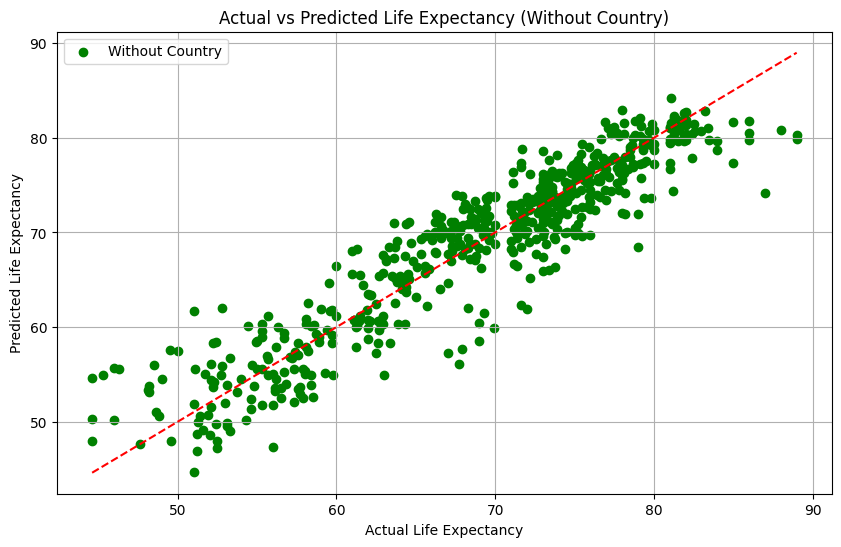

In [30]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test1, y_pred1, color='blue', label='With Country')
plt.plot([min(y_test1), max(y_test1)], [min(y_test1), max(y_test1)], color='red', linestyle='--')
plt.xlabel('Actual Life Expectancy')
plt.ylabel('Predicted Life Expectancy')
plt.title('Actual vs Predicted Life Expectancy (With Country)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(y_test2, y_pred2, color='green', label='Without Country')
plt.plot([min(y_test2), max(y_test2)], [min(y_test2), max(y_test2)], color='red', linestyle='--')
plt.xlabel('Actual Life Expectancy')
plt.ylabel('Predicted Life Expectancy')
plt.title('Actual vs Predicted Life Expectancy (Without Country)')
plt.legend()
plt.grid(True)
plt.show()


# Part F

In [31]:
from sklearn.linear_model import Lasso
simple_model = LinearRegression()
simple_model.fit(X_train1, y_train)

L1_model = Lasso(alpha=0.1, max_iter=1000) 
L1_model.fit(X_train1, y_train)

simple_coeff = simple_model.coef_
L1_coeff = L1_model.coef_

coeff_df = pd.DataFrame({
    'Feature': X_train1.columns,
    'Simple Coeff': simple_coeff,
    'L1 Coeff': L1_coeff
})
coeff_df

c:\Users\USER\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.306e+04, tolerance: 2.130e+01
  model = cd_fast.enet_coordinate_descent(


,Feature,Simple Coeff,L1 Coeff
0,Year,-4.059052,1.314001e-01
1,Adult Mortality,1.084192,-3.655217e-02
2,infant deaths,0.106317,5.197345e-02
3,Alcohol,-0.060269,4.556334e-02
4,percentage expenditure,-0.470741,2.222504e-03
...,...,...,...
232,Country_Yemen,1.110551,-0.000000e+00
233,Country_Zambia,-6.756315,-0.000000e+00
234,Country_Zimbabwe,-12.195733,-0.000000e+00
235,Status_Developed,2.336920,2.320562e-14


In [32]:
print((simple_coeff).mean())
print((L1_coeff).mean())

-0.02039663474690907
-0.022270186269446407


Despite the regularization, the L1 model failed to converge, possibly due to high feature multicollinearity. While the simple linear regression model provided straightforward coefficients, they aligned well with features' correlations with life expectancy, suggesting their importance in prediction.

## General report
###### Load the dataset and understand its structure.
###### Check for missing values and handle them appropriately.
###### Explore the distribution of numerical variables.
###### Check for outliers and decide whether to remove or transform them.

I first downloaded the data from the Kegel site and loaded it into the code. Then I separated the numerical data, which actually we did not have non-numerical data from the beginning. In the next step, I implemented a replacement for the missing data, which used the replacement method with the mean. Then, by checking the box diagram and the shape of the quartiles, the upper limit and the lower limit, outliers were identified and they were rounded to the nearest number in I converted the desired range.\
As you can see, compared to the previous box diagram, we don't have any more data scatter(Outlier).\
This is also the effect of the Standard_scaling function on data.\
Variables that have a higher correlation with the target variable play a greater role in determining the weights.\
From this graph, we can roughly conclude that with the passage of time, the average life expectancy in the countries has increased. That is, from 2000 to 2015, there are fewer countries in which life expectancy is around 50 or less, and there are also more countries in which life expectancy is above 80.\
It can be concluded from this graph that there is a significant difference between life expectancy in developed and developing countries. The more developed a country is, the higher its life expectancy is, and this difference is on average.\
From this graph, it can be concluded that life expectancy has increased over time and in different years.\
correlation coefficient ranges from -1 to 1, where:\
1 indicates a perfect positive linear relationship,\
-1 indicates a perfect negative linear relationship, and\
0 indicates no linear relationship.\
The model that includes the country column gives more accurate results and less error. So, for a more accurate forecast, it is better not to ignore the country pillar and its impact.\
Despite the regularization, the L1 model failed to converge, possibly due to high feature multicollinearity. While the simple linear regression model provided straightforward coefficients, they aligned well with features' correlations with life expectancy, suggesting their importance in prediction.